In [2]:
# rotate 3d volume by arbitrary angle about Z axis
# augment the X and Y volumes
# change world_to_grid accordingly and check the train volumes in 2d3d script

In [21]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

from pathlib import Path
import trimesh
import torch
import numpy as np
import h5py
from transforms.grid_3d import RandomRotate
from scipy import ndimage

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [49]:
data_dir = Path('/mnt/data/scannet/backproj')
fname = 'train100-v6.h5'
f = h5py.File(data_dir / fname, 'r')
print(f['x'].shape)
voxel_dims = (1,1,1)

(120100, 32, 32, 32)


In [52]:
ndx = 1100
x = f['x'][ndx]
(x == 1).sum()

2207

In [70]:
def draw_chunk(chunk):
    scene = trimesh.scene.scene.Scene() 

    print('Draw occupied voxels')
    for i in tqdm(range(chunk.shape[0])):
        for j in range(chunk.shape[1]):
            for k in range(chunk.shape[2]):
                if chunk[i, j, k] == 1:
                    # transformation of this voxel
                    t = torch.eye(4)
                    t[:3, -1] = -torch.Tensor((i, j, k))

                    voxel_transform = torch.inverse(torch.Tensor(t)).numpy()
                    box = trimesh.creation.box(voxel_dims, voxel_transform)
                    box.visual.face_colors = np.zeros((12, 4)) + (0, 0, 255, 128)
                    box.visual.vertex_colors = np.zeros((8, 4)) + (0, 0, 255, 255)
                    scene.add_geometry(box)
    axes = trimesh.creation.axis(axis_radius=0.1, axis_length=10)
    scene.add_geometry(axes)
    scene.show()

In [58]:
def rotate_chunk(chunk, angle):
    rotchunk = ndimage.rotate(chunk, angle, reshape=False, mode='constant', cval=0.0)
    # rotchunk[rotchunk < 0] = -100
    # rotchunk[rotchunk > 0] = 1
    return rotchunk

In [59]:
angles = list(range(0, 360, 45))
print(angles)
rotated_xs = [rotate_chunk(x, angle) for angle in angles]

[0, 45, 90, 135, 180, 225, 270, 315]


[-100.    0.    1.]
[-108.24036  -108.23308  -108.231285 ...   11.211932   11.213635
   11.218157]


(array([5.6700e+02, 0.0000e+00, 0.0000e+00, 1.2255e+04, 5.9400e+02,
        0.0000e+00, 5.9400e+02, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 5.6700e+02, 0.0000e+00,
        0.0000e+00, 0.0000e+00, 0.0000e+00, 0.0000e+00, 5.6700e+02,
        1.7020e+04, 1.0000e+01, 0.0000e+00, 0.0000e+00, 5.9400e+02]),
 array([-108.24036  , -105.85119  , -103.46201  , -101.072845 ,
         -98.68368  ,  -96.2945   ,  -93.905334 ,  -91.51617  ,
         -89.12699  ,  -86.73782  ,  -84.348656 ,  -81.95948  ,
         -79.57031  ,  -77.181145 ,  -74.79197  ,  -72.4028   ,
         -70.01363  ,  -67.62446  ,  -65.23529  ,  -62.846123 

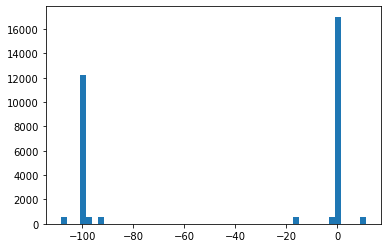

In [74]:
print(np.unique(x))
print(np.unique(rotated_xs[1]))
plt.hist(rotated_xs[1].flatten(),bins=50)

In [56]:
for new in rotated_xs:
    print(new.min(), new.max(), (new == 1).sum())

-100.0 1.0 8379
-100.0 1.0 6501
-100.0 1.0 8379
-100.0 1.0 6501
-100.0 1.0 8379
-100.0 1.0 6501
-100.0 1.0 8379
-100.0 1.0 6501


In [38]:
rotated_xs[0].min(), rotated_xs[0].max()

(-100.0, 1.0)

In [72]:
print(np.unique(x))
scene = trimesh.scene.scene.Scene() 
chunk = x
print('Draw occupied voxels')
for i in tqdm(range(chunk.shape[0])):
    for j in range(chunk.shape[1]):
        for k in range(chunk.shape[2]):
            
                # transformation of this voxel
                t = torch.eye(4)
                t[:3, -1] = -torch.Tensor((i, j, k))

                voxel_transform = torch.inverse(torch.Tensor(t)).numpy()
                box = trimesh.creation.box(voxel_dims, voxel_transform)
                box.visual.face_colors = np.zeros((12, 4)) + (0, 0, 255, 128)
                box.visual.vertex_colors = np.zeros((8, 4)) + (0, 0, 255, 255)
                scene.add_geometry(box)
axes = trimesh.creation.axis(axis_radius=0.1, axis_length=10)
scene.add_geometry(axes)
scene.show()

  0%|          | 0/32 [00:00<?, ?it/s]

[-100.    0.    1.]
Draw occupied voxels


100%|██████████| 32/32 [00:54<00:00,  1.71s/it]


In [ ]:
print(np.unique(x))
scene = trimesh.scene.scene.Scene() 
chunk = rotated_xs[0]
print('Draw occupied voxels')
for i in tqdm(range(chunk.shape[0])):
    for j in range(chunk.shape[1]):
        for k in range(chunk.shape[2]):
            
                # transformation of this voxel
                t = torch.eye(4)
                t[:3, -1] = -torch.Tensor((i, j, k))

                voxel_transform = torch.inverse(torch.Tensor(t)).numpy()
                box = trimesh.creation.box(voxel_dims, voxel_transform)
                box.visual.face_colors = np.zeros((12, 4)) + (0, 0, 255, 128)
                box.visual.vertex_colors = np.zeros((8, 4)) + (0, 0, 255, 255)
                scene.add_geometry(box)
axes = trimesh.creation.axis(axis_radius=0.1, axis_length=10)
scene.add_geometry(axes)
scene.show()